# Crop Productivity Analysis 

## Data

The following datasets are utilized in this analysis for calculating and mapping crop productivity over the past years:

1. **Dynamic World Dataset**:
   - **Source**: [Dynamic World - Google and the World Resources Institute (WRI)](https://dynamicworld.app/) 
   - **Description**:The Dynamic World dataset provides a near real-time, high-resolution (10-meter) global land cover classification. It is derived from Sentinel-2 imagery and utilizes machine learning models to classify land cover into nine distinct classes, including water, trees, grass, crops, built areas, bare ground, shrubs, flooded vegetation, and snow/ice. The dataset offers data with minimal latency, enabling near-immediate analysis and decision-making.
   - **Spatial Resolution**: 10 meters.
   - **Temporal Coverage**: Data is available since mid-2015, updated continuously as Sentinel-2 imagery becomes available capturing near Real-time.

2. **MODIS Dataset**:
   - **Source:** NASA's Moderate Resolution Imaging Spectroradiometer [MODIS](https://modis.gsfc.nasa.gov/data/) on Terra and Aqua satellites.
   - **Description:** The MODIS dataset provides a wide range of data products, including land surface temperature, vegetation indices, and land cover classifications. It is widely used for monitoring and modeling land surface processes.
   - **Spatial Resolution:** 250 meters.
   - **Temporal Coverage:** Data is available from 2000 to the present, with daily to 16-day composite products.

3. **Administrative Boundaries (HDX)**:
   - **Source**: Humanitarian Data Exchange [HDX](https://data.humdata.org/).
   - **Description**: Geographic boundaries used for spatial aggregation and administrative analysis, such as calculating productivity metrics by region (e.g., governorate or district).
   - **Use Case**: The administrative boundaries are used to aggregate EVI statistics by region and facilitate reporting at various administrative levels.


In [76]:
from pathlib import Path
import ast


import ee
import geemap
from gee_zonal import ZonalStats
import geopandas as gpd
import pandas as pd
import plotnine as p9
import altair as alt
import numpy as np
import statsmodels.formula.api as smf
from stargazer.stargazer import Stargazer


PROJECT_ROOT = Path().cwd().parent.parent
DATA_PATH = PROJECT_ROOT / "data"
BOUNDARIES_PATH = DATA_PATH / "boundaries"

ee.Initialize()

In [77]:
def load_syria_boundaries(admin_level: int = 0) -> gpd.GeoDataFrame:
    """Load Syria administrative boundaries from shapefiles."""
    if admin_level not in [0, 1, 2, 3]:
        raise ValueError("admin_level must be 0, 1, 2, or 3")

    shapefile_path = BOUNDARIES_PATH / f"syr_admin{admin_level}.shp"
    return gpd.read_file(shapefile_path)


def bitwiseExtract(value: ee.Image, fromBit: int, toBit: int | None = None) -> ee.Image:
    """Extract bits from a binary image."""
    toBit = fromBit if toBit is None else toBit
    maskSize = ee.Number(1).add(toBit).subtract(fromBit)
    mask = ee.Number(1).leftShift(maskSize).subtract(1)
    return value.rightShift(fromBit).bitwiseAnd(mask)


def apply_modisQA_mask(image: ee.Image):
    sqa = image.select("SummaryQA")
    dqa = image.select("DetailedQA")
    viQualityFlagsS = bitwiseExtract(sqa, 0, 1)
    viQualityFlagsD = bitwiseExtract(dqa, 0, 1)
    viSnowIceFlagsD = bitwiseExtract(dqa, 14)
    # Good data, use with confidence
    mask = (
        viQualityFlagsS.eq(0)
        .And(viQualityFlagsD.eq(0))
        .And(viQualityFlagsS.eq(1))
        .And(viQualityFlagsD.eq(1))
        .And(viSnowIceFlagsD)
        .eq(0)
    )
    return image.updateMask(mask)


def apply_scale_factor(image, scale_factor: float = 0.0001) -> ee.Image:
    """Apply scale factor to an image."""
    scaled_evi = image.multiply(scale_factor).copyProperties(
        image, ["system:time_start"]
    )
    return scaled_evi


def load_evi_data(
    start_date: str | ee.Date,
    end_date: str | ee.Date,
) -> ee.ImageCollection:
    """
    Load EVI data from MODIS.

    Args:
        start_date: Start date.
        end_date: End date.
        apply_crop_mask: Whether to apply crop mask.

    Returns:
        EVI image collection.
    """

    terra = (
        ee.ImageCollection("MODIS/061/MOD13Q1")
        .select(["EVI", "SummaryQA", "DetailedQA"])
        .filterDate(start_date, end_date)
    )

    aqua = (
        ee.ImageCollection("MODIS/061/MYD13Q1")
        .select(["EVI", "SummaryQA", "DetailedQA"])
        .filterDate(start_date, end_date)
    )

    mod13q1_QC = terra.map(apply_modisQA_mask)
    myd13q1_QC = aqua.map(apply_modisQA_mask)
    mxd13q1_cleaned = (
        mod13q1_QC.select("EVI").merge(myd13q1_QC.select("EVI")).map(apply_scale_factor)
    )
    mxd13q1 = mxd13q1_cleaned.sort("system:time_start")
    return mxd13q1


def filter_growing_season(df: pd.DataFrame) -> pd.DataFrame:
    """
    Filter dataframe for growing seasons only.
    Growing season is defined as February to June
    """
    start_year = df["date"].dt.year.min()
    end_year = df["date"].dt.year.max()

    seasons = []
    for year in range(start_year, end_year + 1):
        # February to June of this year
        season_start = pd.Timestamp(f"{year}-02-01")
        season_end = pd.Timestamp(f"{year}-06-30")

        season_data = df.query("date >= @season_start and date <= @season_end").assign(
            year=pd.to_datetime(f"{year}-01-01")
        )

        seasons.append(season_data)

    return pd.concat(seasons, ignore_index=True)


def preprocess_evi(evi_file: str | Path) -> pd.DataFrame:
    """Preprocess EVI CSV file."""
    evi_df = pd.read_csv(evi_file)

    metadata_cols = [
        col for col in evi_df.columns if "EVI" not in col and "system:index" not in col
    ]
    evi_df = (
        evi_df.rename(columns=lambda col: col[-14:] if col.endswith("_EVI") else col)
        .drop(columns=["system:index"])
        .melt(
            id_vars=metadata_cols,
            var_name="band_date",
            value_name="EVI",
        )
        .assign(
            date=lambda df: pd.to_datetime(
                df["band_date"].str.extract(r"(\d{4}_\d{2}_\d{2})")[0],
                format="%Y_%m_%d",
            ),
        )
    )
    return evi_df


def clean_names(df: pd.DataFrame) -> pd.DataFrame:
    """Standardize column names."""
    df = df.rename(columns=lambda col: col.strip().lower().replace(" ", "_"))
    return df

In [78]:
syria_adm0_shp = load_syria_boundaries(admin_level=0)
syria_adm1_shp = load_syria_boundaries(admin_level=1)
syria_adm2_shp = load_syria_boundaries(admin_level=2)
syria_adm3_shp = load_syria_boundaries(admin_level=3)

syria_adm0 = syria_adm0_shp.pipe(geemap.geopandas_to_ee)
syria_adm1 = syria_adm1_shp.pipe(geemap.geopandas_to_ee)
syria_adm2 = syria_adm2_shp.pipe(geemap.geopandas_to_ee)
syria_adm3 = syria_adm3_shp.pipe(geemap.geopandas_to_ee)

start_date = ee.Date("2010-01-01")
end_date = ee.Date("2025-12-31")

evi_data = load_evi_data(start_date, end_date)

In [79]:
def create_cropland_mask_by_year(year: int):
    """
    Create cropland mask for a specific year using Dynamic World land cover.
    For years before 2015, uses 2015 mask as Dynamic World only starts in 2015.
    """
    cropland_value = 4

    # Dynamic World starts in 2015
    mask_year = max(year, 2015)

    yearly_start = ee.Date.fromYMD(mask_year, 1, 1)
    yearly_end = ee.Date.fromYMD(mask_year, 12, 31)

    yearly_lc = (
        ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1")
        .filterDate(yearly_start, yearly_end)
        .filterBounds(syria_adm0)
        .select("label")
        # Get the most frequent land cover class
        .reduce(ee.Reducer.mode())
    )

    crop_mask = yearly_lc.eq(cropland_value)
    return crop_mask


def create_evi_masked_by_year(year: int):
    """Create EVI collection masked to cropland for a specific year."""
    crop_mask = create_cropland_mask_by_year(year)

    evi_subset = evi_data.filterDate(
        ee.Date.fromYMD(year, 1, 1), ee.Date.fromYMD(year, 12, 31)
    )

    def apply_crop_mask(image):
        return image.updateMask(crop_mask).set("year", year)

    evi_masked = evi_subset.map(apply_crop_mask)
    return evi_masked

## Crop area statistics

In [5]:
run = False
if run:
    for year in range(2015, 2026):
        print(f"Processing year {year}...")

        try:
            crop_year = create_cropland_mask_by_year(year)

            zs = ZonalStats(
                ee_dataset=crop_year,
                target_features=syria_adm1,
                scale=10,
                statistic_type="count",
                output_dir="Crop Admin level 1",
                output_name=f"syria_adm1_cropland_stats_{year}",
            )

            zs.runZonalStats()

            print(f"✓ Completed year {year}")

        except Exception as e:
            print(f"✗ Error processing year {year}: {str(e)}")
            continue

In [6]:
run = False
if run:
    for year in range(2015, 2026):
        print(f"Processing year {year}...")

        try:
            crop_year = create_cropland_mask_by_year(year)

            zs = ZonalStats(
                ee_dataset=crop_year,
                target_features=syria_adm2,
                scale=10,
                statistic_type="count",
                output_dir="Crop Admin level 2",
                output_name=f"syria_adm2_cropland_stats_{year}",
            )

            zs.runZonalStats()

            print(f"✓ Completed year {year}")

        except Exception as e:
            print(f"✗ Error processing year {year}: {str(e)}")
            continue

In [7]:
run = False
if run:
    for year in range(2015, 2026):
        print(f"Processing year {year}...")

        try:
            crop_year = create_cropland_mask_by_year(year)

            zs = ZonalStats(
                ee_dataset=crop_year,
                target_features=syria_adm3,
                scale=10,
                statistic_type="count",
                output_dir="Crop Admin level 3",
                output_name=f"syria_adm3_cropland_stats_{year}",
            )

            zs.runZonalStats()

            print(f"✓ Completed year {year}")

        except Exception as e:
            print(f"✗ Error processing year {year}: {str(e)}")
            continue

In [8]:
# Fetch crop mask for 2021 from ESA WorldCover
run = False
if run:
    worldcover = ee.Image("ESA/WorldCover/v200/2021")
    cropland_mask = worldcover.eq(40).rename("crop")

    zs = ZonalStats(
        ee_dataset=cropland_mask,
        target_features=syria_adm1,
        scale=10,
        statistic_type="count",
        output_dir="Crop Admin level 1",
        output_name="syria_adm1_cropland_stats_worldcover_2021",
    )

    zs.runZonalStats()

In [9]:
def load_dict(input_str):
    input_str = input_str.replace("null", "'null'")
    input_str = input_str.replace("=", ":")
    result_dict = ast.literal_eval(input_str)
    return result_dict


crop_count_files = DATA_PATH / "EVI 2010-2025" / "Crop Admin level 1"
dfs = []
for file in crop_count_files.glob("*stats_20*.csv"):
    df = pd.read_csv(file).assign(
        year=file.stem.split("_")[-1],
        histogram=lambda df: df["histogram"].apply(load_dict),
    )
    dfs.append(df)

dfs = pd.concat(dfs, ignore_index=True)
dfs_area = (
    dfs.join(pd.json_normalize(dfs["histogram"]))
    .rename(columns={"null": "Other", 1: "crop_area", 0: "non_crop"})
    .fillna(0)
    .drop(columns=["histogram"])
    .loc[
        :,
        [
            "year",
            "NAME_EN",
            "PCODE",
            "crop_area",
        ],
    ]
    .sort_values(["crop_area"], ascending=False)
)

df_area = (
    dfs_area.assign(
        year=lambda df: df["year"].astype(str),
        # Each pixel is 10m x 10m = 100 m²; convert to hectares (1 ha = 10,000 m²)
        crop_area=lambda df: (df["crop_area"] * 100 / 10000),
    )
    .pivot(
        index=["NAME_EN", "PCODE"],
        columns="year",
        values="crop_area",
    )
    .reset_index()
    .assign(
        pct_change_2015_2025=lambda df: (
            (df["2025"] - df["2015"]) / df["2015"] * 100
        ).round(2),
        abs_pct_change_2015_2025=lambda df: abs(df["pct_change_2015_2025"]),
    )
    .replace([float("inf"), np.nan], 0)
)

df_area

year,NAME_EN,PCODE,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,pct_change_2015_2025,abs_pct_change_2015_2025
0,Al-Hasakeh,SY08,714854.27,642940.29,842853.18,937805.89,1486274.62,1072659.77,1091679.34,823670.34,754854.85,1034279.34,572730.74,-19.88,19.88
1,Aleppo,SY02,677159.30,548560.65,609436.50,614483.24,1347400.67,859714.68,824728.02,612774.25,829480.04,898313.49,508074.11,-24.97,24.97
2,Ar-Raqqa,SY11,225887.99,226464.09,212953.84,247369.79,740367.12,330523.00,304060.95,264993.10,432211.43,381341.67,272511.45,20.64,20.64
3,As-Sweida,SY13,91130.55,110509.87,138329.37,119742.51,231589.97,213363.04,184367.37,122827.58,161659.34,196656.08,102869.49,12.88,12.88
4,Damascus,SY01,240.34,245.89,437.16,297.41,599.15,414.68,473.24,302.95,397.20,303.14,252.29,4.97,4.97
5,Dar'a,SY12,143501.25,131292.72,161850.52,145752.15,237617.71,222389.92,195061.01,161962.58,186564.19,225224.49,130346.10,-9.17,9.17
6,Deir-ez-Zor,SY09,107231.44,94609.66,99363.06,84386.93,213841.18,101319.75,112251.33,102705.00,159704.14,148803.57,116376.97,8.53,8.53
7,Hama,SY05,305300.15,272564.66,320147.46,303076.16,720557.77,412318.25,414159.52,302527.69,399303.03,401522.61,246210.97,-19.35,19.35
8,Homs,SY04,244544.04,242775.97,299343.44,239984.16,638634.26,383729.44,374985.13,278121.70,414470.80,330428.28,198439.45,-18.85,18.85
9,Idleb,SY07,241147.59,197964.99,228873.58,266029.19,372955.60,315185.65,295618.46,210889.10,265525.91,292080.66,183459.61,-23.92,23.92


In [10]:
(
    df_area.filter(
        [
            "NAME_EN",
            "PCODE",
            "2015",
            "2025",
            "pct_change_2015_2025",
            "abs_pct_change_2015_2025",
        ]
    )
    .sort_values("2025", ascending=False)
    .rename(
        columns={
            "NAME_EN": "Name",
            "2015": "Crop Area (ha) in 2015",
            "2025": "Crop Area (ha) in 2025",
            "pct_change_2015_2025": "% Change in Crop Area (2015-2025)",
            "abs_pct_change_2015_2025": "Absolute % Change in Crop Area (2015-2025)",
        }
    )
)

,Name,PCODE,Crop Area (ha) in 2015,Crop Area (ha) in 2025,% Change in Crop Area (2015-2025),Absolute % Change in Crop Area (2015-2025)
0,Al-Hasakeh,SY08,714854.27,572730.74,-19.88,19.88
1,Aleppo,SY02,677159.30,508074.11,-24.97,24.97
2,Ar-Raqqa,SY11,225887.99,272511.45,20.64,20.64
7,Hama,SY05,305300.15,246210.97,-19.35,19.35
8,Homs,SY04,244544.04,198439.45,-18.85,18.85
9,Idleb,SY07,241147.59,183459.61,-23.92,23.92
5,Dar'a,SY12,143501.25,130346.10,-9.17,9.17
6,Deir-ez-Zor,SY09,107231.44,116376.97,8.53,8.53
3,As-Sweida,SY13,91130.55,102869.49,12.88,12.88
11,Quneitra,SY14,63330.46,90956.85,43.62,43.62


## Compare World Cover and Dynamic World Land Cover for Crop Area Statistics

In [11]:
worldcover_raw = pd.read_csv(
    DATA_PATH
    / "EVI 2010-2025"
    / "Crop Admin level 1"
    / "syria_adm1_cropland_stats_worldcover_2021.csv"
).assign(histogram=lambda df: df["histogram"].apply(load_dict))

worldcover = (
    worldcover_raw.copy()
    .join(pd.json_normalize(worldcover_raw["histogram"]))
    .rename(columns={"null": "Other", 1: "crop_area", 0: "non_crop"})
    .fillna(0)
    .drop(columns=["histogram"])
    .assign(
        year=2021,
        crop_area=lambda df: (df["crop_area"] * 100 / 10000),
    )
    .loc[
        :,
        [
            "year",
            "NAME_EN",
            "PCODE",
            "crop_area",
        ],
    ]
    .sort_values(["crop_area"], ascending=False)
)

dfs_area.query("year == '2021'").assign(
    year=lambda df: df["year"].astype(int),
    crop_area=lambda df: (df["crop_area"] * 100 / 10000),
).merge(
    worldcover,
    on=["NAME_EN", "PCODE", "year"],
    suffixes=("_dynamicworld", "_worldcover"),
).assign(
    diff=lambda df: df["crop_area_dynamicworld"] - df["crop_area_worldcover"],
    percent_diff=lambda df: (df["diff"] / df["crop_area_worldcover"] * 100).round(2),
)

,year,NAME_EN,PCODE,crop_area_dynamicworld,crop_area_worldcover,diff,percent_diff
0,2021,Al-Hasakeh,SY08,1091679.34,1873816.37,-782137.03,-41.74
1,2021,Aleppo,SY02,824728.02,1222788.88,-398060.86,-32.55
2,2021,Hama,SY05,414159.52,495341.28,-81181.76,-16.39
3,2021,Homs,SY04,374985.13,318995.11,55990.02,17.55
4,2021,Ar-Raqqa,SY11,304060.95,706843.37,-402782.42,-56.98
5,2021,Idleb,SY07,295618.46,370120.81,-74502.35,-20.13
6,2021,Dar'a,SY12,195061.01,316358.34,-121297.33,-38.34
7,2021,As-Sweida,SY13,184367.37,198094.41,-13727.04,-6.93
8,2021,Rural Damascus,SY03,133357.05,164694.06,-31337.01,-19.03
9,2021,Deir-ez-Zor,SY09,112251.33,316664.79,-204413.46,-64.55


## Crop Seasonality

Using this time series dataset of EVI images, we apply several pre-processing steps to extract critical phenological parameters: start of season (SOS), middle of season (MOS), end of season (EOS), length of season (LOS), etc. This workflow is heavily inspired by the [TIMESAT](https://web.nateko.lu.se/timesat/timesat.asp) software.

**Pre-processing steps**  
1. Remove outliers from dataset on per-pixel basis using median method: outlier if median from a moving window < or > standard deviation of time-series times 2.
2. Interpolate missing values linearly
3. Smooth data on per-pixel basis (using Savitsky Golay filter, window length of 3, and polyorder of 1)  

**Phenology Process**  
We then extract crop seasonality metrics using the seasonal amplitude method from the phenolopy package. 

The chart below shows the result of this process for a single crop pixel. The blue dots represent the raw EVI values, the black line represents the processed EVI values, and the dotted lines represent season parameters extracted for that pixel: start of season, peak of season, and end of season.

In [ ]:
run = False
if run:
    for year in range(2010, 2026):
        print(f"Processing year {year}...")

        try:
            evi_year = create_evi_masked_by_year(year)

            zs = ZonalStats(
                ee_dataset=evi_year,
                target_features=syria_adm0,
                scale=250,
                statistic_type="median",
                output_dir="Admin level 0",
                output_name=f"syria_adm0_evi_stats_{year}",
            )

            zs.runZonalStats()

            print(f"✓ Completed year {year}")

        except Exception as e:
            print(f"✗ Error processing year {year}: {str(e)}")
            continue

Processing year 2025...
✓ Completed year 2025


In [13]:
evi_adm0_df = (
    pd.concat(
        [
            preprocess_evi(
                DATA_PATH
                / "EVI 2010-2025"
                / "Admin level 0"
                / f"syria_adm0_evi_stats_{year}.csv"
            )
            for year in range(2010, 2026)
        ],
    )
    .drop(columns=[".geo"])
    .merge(syria_adm1_shp.filter(["PCODE", "geometry"]), on="PCODE", how="left")
    .sort_values(["date", "NAME_EN"])
    .reset_index(drop=True)
    .assign(
        month=lambda df: df["date"].dt.to_period("M").dt.to_timestamp(),
        year=lambda df: df["date"].dt.to_period("Y").dt.to_timestamp(),
    )
    .set_index("date")
)

In [14]:
from scipy.signal import savgol_filter


def preprocess_series(series):
    """TIMESAT-style preprocessing."""
    series = series.interpolate(limit_direction="both")  # Step 2: Interpolate
    median = series.rolling(window=5, center=True).median()
    std_dev = series.std()
    series = series.mask(
        (series - median).abs() > 2 * std_dev
    )  # Step 1: Remove outliers
    series = series.interpolate(limit_direction="both")
    smoothed = savgol_filter(series, window_length=5, polyorder=2)  # Step 3: Smooth
    return smoothed


def extract_sos_mos_eos(smoothed, dates, threshold=0.2):
    max_val = smoothed.max()
    min_val = smoothed.min()
    amp = max_val - min_val
    sos = mos = eos = None
    for i in range(1, len(smoothed)):
        if sos is None and smoothed[i] > min_val + threshold * amp:
            sos = dates[i]
        if smoothed[i] == max_val:
            mos = dates[i]
        if sos is not None and smoothed[i] < min_val + threshold * amp:
            eos = dates[i]
            break
    return sos, mos, eos

In [ ]:
seasonality_data = (
    evi_adm0_df.assign(month=lambda df: df.index.month)
    .groupby("month")
    .agg(EVI=("EVI", "mean"))
    .assign(smoothed=lambda df: preprocess_series(df["EVI"]))
    .assign(
        sos=lambda df: extract_sos_mos_eos(df["smoothed"].values, df.index)[0],
        mos=lambda df: extract_sos_mos_eos(df["smoothed"].values, df.index)[1],
        eos=lambda df: extract_sos_mos_eos(df["smoothed"].values, df.index)[2],
    )
    .reset_index()
    .assign(
        smoothed=lambda df: df["smoothed"].round(3), EVI=lambda df: df["EVI"].round(3)
    )
)

base = alt.Chart(seasonality_data)

points = base.mark_circle(color="steelblue", size=60).encode(
    x=alt.X(
        "month:O",
        scale=alt.Scale(domain=list(range(1, 13))),
        axis=alt.Axis(
            labelExpr="['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'][datum.value-1]",
            title="",
        ),
    ),
    y=alt.Y("EVI:Q", scale=alt.Scale(domain=[0.1, 0.31])),
    tooltip=["month:O", "EVI:Q"],
)

line = base.mark_line(color="black").encode(
    x="month:O", y=alt.Y("smoothed:Q"), tooltip=["month:O", "smoothed:Q"]
)

sos_line = (
    base.mark_rule(strokeDash=[5, 5], color="gray")
    .encode(x="sos:O")
    .transform_filter(alt.expr.isValid(alt.datum.sos))
)

mos_line = (
    base.mark_rule(strokeDash=[5, 5], color="gray")
    .encode(x="mos:O")
    .transform_filter(alt.expr.isValid(alt.datum.mos))
)

eos_line = (
    base.mark_rule(strokeDash=[5, 5], color="gray")
    .encode(x="eos:O")
    .transform_filter(alt.expr.isValid(alt.datum.eos))
)


chart = (points + line + sos_line + mos_line + eos_line).properties(
    title="Crop Seasonality based on EVI", width=600, height=400
)

chart

SchemaValidationError: `Axis` has no parameter named 'rotate'

Existing parameter names are:
aria               gridDashOffset     labelLineHeight   tickCount        titleBaseline     
bandPosition       gridOpacity        labelOffset       tickDash         titleColor        
description        gridWidth          labelOpacity      tickDashOffset   titleFont         
domain             labelAlign         labelOverlap      tickExtra        titleFontSize     
domainCap          labelAngle         labelPadding      tickMinStep      titleFontStyle    
domainColor        labelBaseline      labelSeparation   tickOffset       titleFontWeight   
domainDash         labelBound         labels            tickOpacity      titleLimit        
domainDashOffset   labelColor         maxExtent         tickRound        titleLineHeight   
domainOpacity      labelExpr          minExtent         tickSize         titleOpacity      
domainWidth        labelFlush         offset            tickWidth        titlePadding      
format             labelFlushOffset   orient            ticks            titleX            
formatType         labelFont          position          title            titleY            
grid               labelFontSize      style             titleAlign       translate         
gridCap            labelFontStyle     tickBand          titleAnchor      values            
gridColor          labelFontWeight    tickCap           titleAngle       zindex            
gridDash           labelLimit         tickColor                                            

See the help for `Axis` to read the full description of these parameters

Based on the phenology process, we identified the seasonality to start in February and end in June with the peak being in March. This can vary with geographic region and crop type as well, however, that has not been taken into consideration in this version.

In [17]:
evi_adm0_median = (
    evi_adm0_df.reset_index()
    .pipe(filter_growing_season)
    .groupby("year", as_index=False)
    .agg(EVI=("EVI", "median"))
)

nearest = alt.selection_point(
    nearest=True, on="pointerover", fields=["year"], empty=False
)
when_near = alt.when(nearest)

line = (
    alt.Chart(evi_adm0_median, title="Median EVI in Syria (2010-2025)")
    .mark_line(point=True)
    .encode(
        x=alt.X("year:T", title=""),
        y=alt.Y("EVI:Q", scale=alt.Scale(domain=[0, 0.35])),
    )
)


tooltip = (
    alt.Chart(evi_adm0_median)
    .mark_rule(color="gray")
    .encode(
        x=alt.X("year:T", axis=alt.Axis(grid=False)),
        opacity=when_near.then(alt.value(0.3)).otherwise(alt.value(0)),
        tooltip=[
            alt.Tooltip("year", title="Year", timeUnit="year"),
            alt.Tooltip("EVI", format=".3f"),
        ],
    )
    .add_params(nearest)
)

alt.layer(line, tooltip).properties(width=600, height=300)

alt.LayerChart(...)

## Pre and Post Regime Change

In [18]:
evi_adm0_2024_2025 = (
    evi_adm0_df.query("date >= '2023-01-01'")
    .groupby(pd.Grouper(freq="MS"))
    .agg(EVI=("EVI", "median"))
    .reset_index()
)

nearest = alt.selection_point(
    nearest=True, on="pointerover", fields=["date"], empty=False
)
when_near = alt.when(nearest)

line = (
    alt.Chart(evi_adm0_2024_2025)
    .mark_line(point=True)
    .encode(
        x=alt.X("date:T", title=""),
        y=alt.Y("EVI:Q"),
    )
)

tooltip = (
    alt.Chart(evi_adm0_2024_2025)
    .mark_rule(color="gray")
    .encode(
        x=alt.X("date:T", axis=alt.Axis(grid=False)),
        opacity=when_near.then(alt.value(0.3)).otherwise(alt.value(0)),
        tooltip=[
            alt.Tooltip("date:T", timeUnit="yearmonth"),
            alt.Tooltip("EVI:Q", format=".3f"),
        ],
    )
    .add_params(nearest)
)


rule = (
    alt.Chart(pd.DataFrame({"date": [pd.Timestamp("2024-11-01")]}))
    .mark_rule(color="gray", strokeDash=[5, 5])
    .encode(x=alt.X("date:T"))
)

annotation = (
    alt.Chart(
        pd.DataFrame({"date": [pd.Timestamp("2024-11-01")], "label": ["Regime change"]})
    )
    .mark_text(
        align="left",
        dx=5,
        dy=50,
        fontSize=11,
        color="gray",
    )
    .encode(
        x=alt.X("date:T"),
        y=alt.value(0),
        text="label:N",
    )
)


alt.layer(line, tooltip, rule, annotation).properties(width=600, height=300)


alt.LayerChart(...)

In [45]:
evi_adm0_2024_2025_growing = (
    evi_adm0_df.query("date >= '2024-01-01'")
    .reset_index()
    .pipe(filter_growing_season)
    .groupby(pd.Grouper(freq="MS", key="date"))
    .agg(EVI=("EVI", "median"))
    .reset_index()
    .assign(
        month=lambda df: df["date"].dt.month,
        year=lambda df: df["date"].dt.year.astype(str),
    )
    .dropna()
)

nearest = alt.selection_point(
    nearest=True, on="pointerover", fields=["month"], empty=False
)
when_near = alt.when(nearest)

line = (
    alt.Chart(
        evi_adm0_2024_2025_growing,
    )
    .mark_line(point=True)
    .encode(
        x=alt.X(
            "month:Q",
            axis=alt.Axis(
                labelExpr="['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'][datum.value-1]"
            ),
        ),
        y="EVI",
        color="year",
    )
)

tooltip = (
    alt.Chart(evi_adm0_2024_2025_growing)
    .transform_pivot("year", value="EVI", groupby=["month"])
    .mark_rule(color="gray")
    .encode(
        x=alt.X(
            "month:Q",
            axis=alt.Axis(grid=False),
        ),
        opacity=when_near.then(alt.value(0.3)).otherwise(alt.value(0)),
        tooltip=[
            alt.Tooltip(c, type="quantitative", format=".3f") for c in ["2024", "2025"]
        ],
    )
    .add_params(nearest)
)


alt.layer(line, tooltip).properties(width=600, height=300).configure_title(
    anchor="start", subtitleFontSize=10, subtitleColor="gray"
).properties(
    title={
        "text": "Median EVI in Syria during Growing Season (Feb-Jun) for 2024 and 2025",
        "subtitle": "Growing season defined as February to June",
    }
)

alt.LayerChart(...)

In [70]:
evi_adm0_2024_2025 = (
    evi_adm0_df.query("date >= '2024-01-01'")
    .reset_index()
    .assign(is_regime_change=lambda df: df["date"] >= pd.Timestamp("2024-11-01"))
)

mod_1 = smf.ols("EVI ~ C(is_regime_change)", data=evi_adm0_2024_2025).fit()
models = Stargazer([mod_1])
models.rename_covariates({"C(is_regime_change)[T.True]": "Post-Regime Change"})
models.show_confidence_intervals(True)
models

## Anomaly

In [20]:
run = False
if run:
    baseline_evis = [create_evi_masked_by_year(year) for year in range(2015, 2021)]
    baseline_evi_collection = reduce(lambda x, y: x.merge(y), baseline_evis)

    baseline_median = baseline_evi_collection.median()
    baseline_stdev = baseline_evi_collection.reduce(ee.Reducer.stdDev())

    projection = baseline_median.projection().getInfo()

    for year in range(2021, 2026):
        print(f"Processing year {year}...")
        evi_year = create_evi_masked_by_year(year)
        evi_year_median = evi_year.median()

        evi_year_zscore = (
            evi_year_median.subtract(baseline_median)
            .divide(baseline_stdev)
            .rename("EVI_Difference")
        )

        task = ee.batch.Export.image.toDrive(
            image=evi_year_zscore,
            description=f"syria_evi_difference_{year}_vs_2015-2020",
            folder="Syria Z-score",
            crs=projection["crs"],
            scale=250,
            region=syria_adm0.geometry().bounds(),
        )
        task.start()

In [21]:
def read_tif_files(pattern="../../docs/images/agriculture/evi_zscore_*.tif"):
    """
    Read all TIF files matching the pattern and return a dictionary
    with year as key and array data as value
    """
    files = sorted(glob.glob(pattern))
    data_dict = {}

    for file in files:
        # Extract year from filename
        # syria_evi_difference_2021_vs_2015-2020
        year = file.split("_")[-3]

        # Read the raster file
        with rasterio.open(file) as src:
            data = src.read(1)  # Read first band

            # Handle NoData values
            if src.nodata is not None:
                mask = data != src.nodata
                valid_data = data[mask]
            else:
                valid_data = data[~np.isnan(data)]

            data_dict[int(year)] = valid_data

    return data_dict


def calculate_zscore_percentages(data_dict):
    """
    Calculate the percentage of area in each Z-score bin for each year
    """
    # Define Z-score bins
    bins = [float("-inf"), -2, -1, -0.5, 0.5, 1, 2, float("inf")]
    bin_labels = [
        "< -2",
        "(-2, -1]",
        "(-1, -0.5]",
        "(-0.5, 0.5]",
        "(0.5, 1]",
        "(1, 2]",
        "> 2",
    ]

    results = {}

    for year, zscores in data_dict.items():
        # Calculate percentages for each bin
        percentages = []
        total_count = len(zscores)

        for i in range(len(bins) - 1):
            if i == 0:  # First bin (< -2)
                count = np.sum(zscores < bins[i + 1])
            elif i == len(bins) - 2:  # Last bin (> 2)
                count = np.sum(zscores > bins[i])
            else:  # Middle bins
                count = np.sum((zscores > bins[i]) & (zscores <= bins[i + 1]))

            percentage = (count / total_count) * 100 if total_count > 0 else 0
            percentages.append(percentage)

        results[year] = percentages

    return results, bin_labels


def plot_productivity_anomalies(
    data_dict, title="Anomalies in Agricultural Productivity (EVI)"
):
    """
    Create a stacked bar chart showing Z-score percentages by year
    """
    results, bin_labels = calculate_zscore_percentages(data_dict)

    # Convert to DataFrame
    df = pd.DataFrame(results, index=bin_labels).T
    df.sort_index(inplace=True)

    # Define colors for each Z-score range
    colors = [
        "#8B4513",
        "#CD853F",
        "#DEB887",
        "#E0F5F5",
        "#48D1CC",
        "#008B8B",
        "#006400",
    ]

    # Create the plot
    fig, ax = plt.subplots(figsize=(12, 8))

    # Create stacked horizontal bars
    bars = ax.barh(
        df.index.astype(str), df.iloc[:, 0], color=colors[0], label=bin_labels[0]
    )

    for i in range(1, len(bin_labels)):
        ax.barh(
            df.index.astype(str),
            df.iloc[:, i],
            left=df.iloc[:, :i].sum(axis=1),
            color=colors[i],
            label=bin_labels[i],
        )

    # Set labels and title
    ax.set_xlabel("% of Crop Area", fontsize=12)
    ax.set_title(title, fontsize=16, fontweight="bold")

    # Set x-axis limits and format
    ax.set_xlim(0, 100)
    ax.set_xticks([0, 25, 50, 75, 100])
    ax.set_xticklabels(["0%", "25%", "50%", "75%", "100%"])

    # Add grid
    ax.grid(axis="x", alpha=0.3)

    # Create custom legend
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        handles,
        labels,
        loc="center left",
        bbox_to_anchor=(1, 0.5),
        title="Z-Score",
        fontsize=10,
    )

    # Add source text
    plt.figtext(
        0.99,
        0.02,
        "Source: MODIS Terra and Aqua",
        ha="right",
        va="bottom",
        fontsize=10,
        style="italic",
    )

    plt.tight_layout()
    plt.subplots_adjust(right=0.8)

    return fig, ax

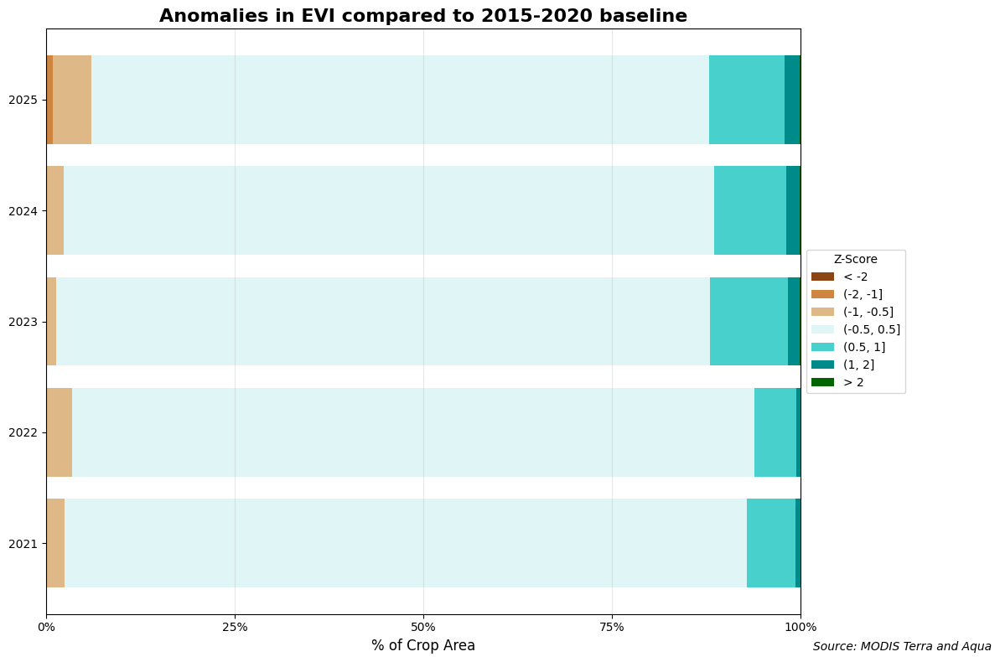

In [22]:
# Read all TIF files
data_dict = read_tif_files(
    "../../data/EVI 2010-2025/Syria Z-score/syria_evi_difference*.tif"
)

# Create the plot
fig, ax = plot_productivity_anomalies(
    data_dict, title="Anomalies in EVI compared to 2015-2020 baseline"
)

# Show the plot
plt.show()

## Trends in EVI

### Admin level 1

In [81]:
run = False
if run:
    for year in range(2010, 2026):
        print(f"Processing year {year}...")

        try:
            evi_year = create_evi_masked_by_year(year)

            zs = ZonalStats(
                ee_dataset=evi_year,
                target_features=syria_adm1,
                scale=250,
                statistic_type="median",
                output_dir="Admin level 1",
                output_name=f"syria_adm1_evi_stats_{year}",
            )

            zs.runZonalStats()

            print(f"✓ Completed year {year}")

        except Exception as e:
            print(f"✗ Error processing year {year}: {str(e)}")
            continue

Processing year 2025...
✓ Completed year 2025


In [24]:
evi_adm1_df = (
    pd.concat(
        [
            preprocess_evi(
                DATA_PATH
                / "EVI 2010-2025"
                / "Admin level 1"
                / f"syria_adm1_evi_stats_{year}.csv"
            )
            for year in range(2010, 2026)
        ],
    )
    .drop(columns=[".geo"])
    .merge(syria_adm1_shp.filter(["PCODE", "geometry"]), on="PCODE", how="left")
    .sort_values(["date", "NAME_EN"])
    .reset_index(drop=True)
)

In [119]:
def extract_seasonality_by_region(df: pd.DataFrame) -> pd.DataFrame:
    """Extract seasonality metrics (SOS, MOS, EOS) for each region."""
    results = []

    for pcode in df["PCODE"].unique():
        region_data = df.copy().loc[lambda df: df["PCODE"] == pcode]
        name = region_data["NAME_EN"].iloc[0]

        seasonality = (
            region_data.assign(month=lambda x: x.index.month)
            .groupby("month")
            .agg(EVI=("EVI", "mean"))
            .assign(smoothed=lambda x: preprocess_series(x["EVI"]))
        )

        sos, mos, eos = extract_sos_mos_eos(
            seasonality["smoothed"].values, seasonality.index
        )

        region_seasonality = seasonality.reset_index().assign(
            PCODE=pcode,
            Name=name,
            sos=sos,
            mos=mos,
            eos=eos,
            smoothed=lambda x: x["smoothed"].round(3),
            EVI=lambda x: x["EVI"].round(3),
        )

        results.append(region_seasonality)

    return pd.concat(results, ignore_index=True)


region_seasonality = extract_seasonality_by_region(
    evi_adm1_df.set_index("date")
).assign(
    month_name=lambda df: df["month"].map(
        {
            1: "Jan",
            2: "Feb",
            3: "Mar",
            4: "Apr",
            5: "May",
            6: "Jun",
            7: "Jul",
            8: "Aug",
            9: "Sep",
            10: "Oct",
            11: "Nov",
            12: "Dec",
        }
    )
)

nearest = alt.selection_point(
    nearest=True, on="pointerover", fields=["month"], empty=False
)
when_near = alt.when(nearest)

line = (
    alt.Chart(region_seasonality)
    .mark_line(color="black")
    .encode(
        x=alt.X(
            "month:O",
            axis=alt.Axis(
                labelExpr="['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'][datum.value-1]",
                title="",
            ),
        ),
        y=alt.Y("smoothed:Q", axis=alt.Axis(title="")),
    )
    .properties(width=200, height=130)
)

point = (
    alt.Chart(region_seasonality)
    .mark_circle(color="steelblue", size=30)
    .encode(
        x=alt.X("month:O"),
        y=alt.Y("EVI:Q"),
    )
)

# SOS, MOS, EOS vertical lines
vertical_lines = (
    (
        alt.Chart(region_seasonality)
        .mark_rule(strokeDash=[5, 5], color="gray")
        .encode(x=alt.X("sos:O"))
        .transform_filter(alt.expr.isValid(alt.datum.sos))
    )
    + (
        alt.Chart(region_seasonality)
        .mark_rule(strokeDash=[5, 5], color="gray")
        .encode(x=alt.X("mos:O"))
        .transform_filter(alt.expr.isValid(alt.datum.mos))
    )
    + (
        alt.Chart(region_seasonality)
        .mark_rule(strokeDash=[5, 5], color="gray")
        .encode(x=alt.X("eos:O"))
        .transform_filter(alt.expr.isValid(alt.datum.eos))
    )
)

tooltip = (
    alt.Chart(region_seasonality)
    .mark_rule(color="gray")
    .encode(
        x=alt.X("month:O"),
        opacity=when_near.then(alt.value(0.3)).otherwise(alt.value(0)),
        tooltip=[
            alt.Tooltip("month_name:N", title="Month"),
            alt.Tooltip("smoothed:Q", title="Smoothed EVI", format=".3f"),
            alt.Tooltip("EVI:Q", title="Average EVI", format=".3f"),
        ],
    )
    .add_params(nearest)
)


alt.layer(line, point, vertical_lines, tooltip).facet(
    facet=alt.Facet("Name:N", header=alt.Header(title=None)),
    columns=4,
).resolve_scale(y="independent").configure_title(
    anchor="start", subtitleFontSize=10, subtitleColor="gray"
).properties(
    title={
        "text": "EVI Seasonality by Region in Syria",
        "subtitle": "Smoothed lines represent seasonal trends; points represent average EVI values",
    }
)

alt.FacetChart(...)

The figure below shows the trends of median EVI from 2010-2025 on admin level 1.

In [93]:
evi_adm1_median = (
    evi_adm1_df.pipe(filter_growing_season)
    .groupby(["year", "PCODE", "NAME_EN"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"NAME_EN": "Name"})
)

nearest = alt.selection_point(
    nearest=True, on="pointerover", fields=["year"], empty=False
)
when_near = alt.when(nearest)

line = (
    alt.Chart(evi_adm1_median, title="Median EVI in Syria by Admin Level 1 (2010-2025)")
    .mark_line(point=True)
    .encode(
        x="year:T",
        y="EVI:Q",
    )
    .properties(width=160, height=100)
)

tooltip = (
    alt.Chart(evi_adm1_median)
    .mark_rule(color="gray")
    .encode(
        x="year:T",
        opacity=when_near.then(alt.value(0.3)).otherwise(alt.value(0)),
        tooltip=[
            alt.Tooltip("year:T", title="Date", timeUnit="yearmonth"),
            alt.Tooltip("EVI:Q", format=".3f"),
        ],
    )
    .add_params(nearest)
)

alt.layer(line, tooltip).facet(
    facet=alt.Facet("Name:N", header=alt.Header(title=None)), columns=4
).configure_title(anchor="start", subtitleFontSize=10, subtitleColor="gray").properties(
    title={
        "text": "Median EVI in Syria by Admin Level 1 (2010-2025)",
        "subtitle": "Growing season defined as February to June",
    }
)

alt.FacetChart(...)

The figure below shows a choropleth maps of EVI for each admin level 1 from 2010-2025

In [27]:
(
    alt.Chart(
        evi_adm1_median.assign(year=lambda df: df["year"].dt.year),
        title="Median EVI in Syria by Admin Level 1 (2010-2025)",
    )
    .mark_geoshape(stroke="white", strokeWidth=1.5)
    .encode(
        shape="geo:G",
        color="EVI:Q",
        tooltip=["Name:N", "EVI:Q"],
        facet=alt.Facet("year:N", columns=4, title=None),
    )
    .transform_lookup(
        lookup="PCODE",
        from_=alt.LookupData(data=syria_adm1_shp, key="PCODE"),
        as_="geo",
    )
    .properties(width=150, height=150)
)

alt.Chart(...)

The figure below shows the percent change of EVI compared to previous year from 2010-2025 on admin level 1.

In [43]:
evi_adm1_pct_change = evi_adm1_median.sort_values(["PCODE", "year"]).assign(
    EVI_pct_change=lambda df: df.groupby(["PCODE", "Name"])["EVI"].pct_change(),
)

nearest = alt.selection_point(
    nearest=True, on="pointerover", fields=["year"], empty=False
)
when_near = alt.when(nearest)

line = (
    alt.Chart(
        evi_adm1_pct_change,
        title="EVI Percentage Change in Syria by Admin Level 1 (2010-2025)",
    )
    .mark_line(point=True)
    .encode(
        x="year:T",
        y=alt.Y(
            "EVI_pct_change:Q", axis=alt.Axis(format=".1%"), title="Percentage Change"
        ),
        tooltip=[
            "year:T",
            alt.Tooltip("EVI_pct_change:Q", format=".1%", title="EVI % Change"),
        ],
    )
    .properties(width=160, height=100)
)

tooltip = (
    alt.Chart(evi_adm1_pct_change)
    .mark_rule(color="gray")
    .encode(
        x="year:T",
        opacity=when_near.then(alt.value(0.3)).otherwise(alt.value(0)),
        tooltip=[
            alt.Tooltip("year:T", title="Date", timeUnit="yearmonth"),
            alt.Tooltip("EVI_pct_change:Q", format=".1%", title="EVI % Change"),
        ],
    )
    .add_params(nearest)
)

alt.layer(line, tooltip).facet(
    facet=alt.Facet("Name:N", header=alt.Header(title=None)), columns=4
).configure_title(anchor="start", subtitleFontSize=10, subtitleColor="gray").properties(
    title={
        "text": "EVI Percentage Change in Syria by Admin Level 1 (2010-2025)",
        "subtitle": "Growing season defined as February to June",
    }
)

alt.FacetChart(...)

### Admin level 2

In [29]:
run = False
if run:
    for year in range(2010, 2026):
        print(f"Processing year {year}...")

        try:
            evi_year = create_evi_masked_by_year(year)

            zs = ZonalStats(
                ee_dataset=evi_year,
                target_features=syria_adm2,
                scale=250,
                statistic_type="median",
                output_dir="Admin level 2",
                output_name=f"syria_adm2_evi_stats_{year}",
            )

            zs.runZonalStats()

            print(f"✓ Completed year {year}")

        except Exception as e:
            print(f"✗ Error processing year {year}: {str(e)}")
            continue

In [30]:
evi_adm2_df = (
    pd.concat(
        [
            preprocess_evi(
                DATA_PATH
                / "EVI 2010-2025"
                / "Admin level 2"
                / f"syria_adm2_evi_stats_{year}.csv"
            )
            for year in range(2010, 2026)
        ],
    )
    .drop(columns=[".geo"])
    .merge(syria_adm2_shp.filter(["PCODE", "geometry"]), on="PCODE", how="left")
    .sort_values(["date", "NAME_EN"])
)

In [31]:
evi_adm2_median = (
    evi_adm2_df.pipe(filter_growing_season)
    .groupby(["year", "PCODE", "NAME_EN"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"NAME_EN": "Name"})
)

options = evi_adm2_median["Name"].unique().tolist()

input_dropdown = alt.binding_select(options=options, name="Region ")

selection = alt.selection_point(fields=["Name"], bind=input_dropdown, value=options[0])

(
    alt.Chart(evi_adm2_median, title="Median EVI in Syria by Admin Level 2 (2010-2025)")
    .mark_line(point=True)
    .encode(
        x="year:T",
        y="EVI:Q",
        tooltip=["year:T", "EVI:Q"],
        color=alt.Color("Name:N"),
    )
    .add_params(selection)
    .transform_filter(selection)
    .properties(width=500, height=300)
)

alt.Chart(...)

The figure below shows a choropleth maps of EVI for each admin level 2 from 2010-2025

In [32]:
evi_adm2_median = (
    evi_adm2_df.pipe(filter_growing_season)
    .assign(year=lambda df: df["year"].dt.year)
    .groupby(["NAME_EN", "PCODE", "year"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"NAME_EN": "Name"})
)

(
    alt.Chart(evi_adm2_median, title="Median EVI in Syria by Admin Level 2 (2010-2025)")
    .mark_geoshape(stroke="white", strokeWidth=1)
    .encode(
        shape="geo:G",
        color="EVI:Q",
        tooltip=["Name:N", "EVI:Q"],
        facet=alt.Facet("year:N", columns=4),
    )
    .transform_lookup(
        lookup="PCODE",
        from_=alt.LookupData(data=syria_adm2_shp, key="PCODE"),
        as_="geo",
    )
    .properties(width=150, height=150)
    .interactive()
)

alt.Chart(...)

### Admin level 3

In [33]:
run = False
if run:
    for year in range(2010, 2026):
        print(f"Processing year {year}...")

        try:
            evi_year = create_evi_masked_by_year(year)

            zs = ZonalStats(
                ee_dataset=evi_year,
                target_features=syria_adm3,
                scale=250,
                statistic_type="median",
                output_dir="Admin level 3",
                output_name=f"syria_adm3_evi_stats_{year}",
            )

            zs.runZonalStats()

            print(f"✓ Completed year {year}")

        except Exception as e:
            print(f"✗ Error processing year {year}: {str(e)}")
            continue

In [34]:
evi_adm3_df = (
    pd.concat(
        [
            preprocess_evi(
                DATA_PATH
                / "EVI 2010-2025"
                / "Admin level 3"
                / f"syria_adm3_evi_stats_{year}.csv"
            )
            for year in range(2010, 2026)
        ],
    )
    .drop(columns=[".geo"])
    .merge(syria_adm2_shp.filter(["PCODE", "geometry"]), on="PCODE", how="left")
    .sort_values(["date", "NAME_EN"])
    .reset_index(drop=True)
)

In [35]:
evi_adm3_median = (
    evi_adm3_df.pipe(filter_growing_season)
    .groupby(["year", "PCODE", "NAME_EN"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"NAME_EN": "Name"})
)

options = evi_adm3_median["Name"].unique().tolist()

input_dropdown = alt.binding_select(options=options, name="Region ")

selection = alt.selection_point(fields=["Name"], bind=input_dropdown, value=options[0])

(
    alt.Chart(evi_adm3_median, title="Median EVI in Syria by Admin Level 3 (2010-2025)")
    .mark_line(point=True)
    .encode(
        x="year:T",
        y="EVI:Q",
        tooltip=["year:T", "EVI:Q"],
        color=alt.Color("Name:N"),
    )
    .add_params(selection)
    .transform_filter(selection)
    .properties(width=500, height=300)
)

alt.Chart(...)

The figure below shows a choropleth maps of EVI for each admin level 3 from 2010-2025

In [36]:
def complete_cases(
    df: pd.DataFrame, group_cols: list[str], value_col: str
) -> pd.DataFrame:
    """Make sure all combinations of group_cols are present, and fill missing values with 0."""
    complete_df = (
        pd.MultiIndex.from_product(
            [df[col].unique() for col in group_cols],
            names=group_cols,
        )
        .to_frame(index=False)
        .merge(df, on=group_cols, how="left")
        .fillna({value_col: 0})
    )
    return complete_df


evi_adm3_median = (
    evi_adm3_df.pipe(filter_growing_season)
    .assign(year=lambda df: df["year"].dt.year)
    .groupby(["NAME_EN", "PCODE", "year"], as_index=False)
    .agg(EVI=("EVI", "median"))
    .assign(EVI=lambda df: df["EVI"].round(3))
    .rename(columns={"NAME_EN": "Name"})
    .pipe(complete_cases, group_cols=["PCODE", "year"], value_col="EVI")
)

(
    alt.Chart(evi_adm3_median, title="Median EVI in Syria by Admin Level 3 (2010-2025)")
    .mark_geoshape(stroke="white", strokeWidth=0.5)
    .encode(
        shape="geo:G",
        color="EVI:Q",
        tooltip=["Name:N", "EVI:Q"],
        facet=alt.Facet("year:N", columns=4, title=None),
    )
    .transform_lookup(
        lookup="PCODE",
        from_=alt.LookupData(data=syria_adm3_shp, key="PCODE"),
        as_="geo",
    )
    .properties(width=170, height=170)
    .interactive()
)

alt.Chart(...)